# Setup

In [1]:
import os
import time
import glob
import argparse
from termcolor import colored

import numpy as np
import torch
from tqdm import tqdm
from threading import Thread
import json
import cv2
import copy

from vggt_slam import slam_utils
from vggt_slam.solver import Solver
from vggt.models.vggt import VGGT

from config.config import load_config, config

from scene.keyframe import Keyframe
from scene.scene_model import SceneModel

from gaussianviewer import GaussianViewer
from webviewer.webviewer import WebViewer
from graphdecoviewer.types import ViewerMode
from utils import increment_runtime, get_vggt_image_size


torch.random.manual_seed(0)
torch.cuda.manual_seed(0)
np.random.seed(0)

###### load config
load_config("config/base.yaml")
print(f"config:\n{config}")

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
config:
{'dataset': {'downsample_factor': -1, 'save_every': -1}, 'tracking': {'solver_vis': False, 'vis_map': True, 'vis_flow': False, 'log_results': False, 'skip_dense_log': False, 'log_path': '', 'plot_focal_lengths': False, 'use_optical_flow_downsample': True, 'use_sim3': True, 'use_point_map': False, 'enable_loop_closure': True, 'min_disparity': 50.0, 'overlap_size': 1, 'min_sim_thres': 0.5, 'conf_threshold': 25.0}, 'mapping': {'pyr_levels': 2, 'sh_degree': 3, 'eval_poses': False, 'use_colmap_poses': False, 'lr_poses': 0.0001, 'lr_exposure': 0.0005, 'lr_depth_scale_offset': 0.0001, 'position_lr_init': 5e-05, 'position_lr_decay': 0.99998, 'feature_lr': 0.005, 'opacity_lr': 0.1, 'scaling_lr': 0.01, 'rotation_lr': 0.002, 'num_iterations': 150, 'lambda_dssim': 0.2, 'depth_loss_weight_init': 0.01, 'depth_loss_weight_deca

In [2]:
###### VGGT solver
solver = Solver(
    init_conf_threshold = config['tracking']['conf_threshold'],
    use_point_map       = config['tracking']['use_point_map'],
    use_sim3            = config['tracking']['use_sim3'],
    enable_loop_closure = config['tracking']['enable_loop_closure'],
    solver_vis          = config['tracking']['solver_vis'],
)

print("Initializing and loading VGGT model...")
vggt_model = VGGT()
model_path = "/home/grl/vggt_gs_recon/checkpoints/vggt_model_1B.pt"
vggt_model.load_state_dict(torch.load(model_path))
vggt_model.eval()
vggt_model = vggt_model.to(device)
print(f'Loaded VGGT model from {model_path}!')

Loading ImageRetrieval model from checkpoints/megaloc.torch...


Using cache found in /home/grl/.cache/torch/hub/facebookresearch_dinov2_main
/home/grl/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/home/grl/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/home/grl/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


Solver initialized!
Initializing and loading VGGT model...
Loaded VGGT model from /home/grl/vggt_gs_recon/checkpoints/vggt_model_1B.pt!


## replica room2

In [3]:
all_subsets = [
    [
        'frame000000.jpg', 'frame000018.jpg', 'frame000030.jpg', 'frame000048.jpg',
        'frame000062.jpg', 'frame000079.jpg', 'frame000126.jpg', 'frame000142.jpg',
        'frame000154.jpg', 'frame000165.jpg', 'frame000175.jpg', 'frame000190.jpg',
        'frame000202.jpg', 'frame000211.jpg', 'frame000221.jpg', 'frame000263.jpg',
        'frame000272.jpg',
    ],
    [
        'frame000272.jpg', 'frame000280.jpg', 'frame000287.jpg', 'frame000296.jpg', 
        'frame000326.jpg', 'frame000331.jpg', 'frame000336.jpg', 'frame000342.jpg', 
        'frame000348.jpg', 'frame000355.jpg', 'frame000364.jpg', 'frame000375.jpg', 
        'frame000396.jpg', 'frame000410.jpg', 'frame000427.jpg', 'frame000439.jpg',
        'frame000455.jpg'
    ],
    [
        'frame000455.jpg', 'frame000480.jpg', 'frame000503.jpg', 'frame000528.jpg',
        'frame000544.jpg', 'frame000558.jpg', 'frame000577.jpg', 'frame000606.jpg',
        'frame000637.jpg', 'frame000661.jpg', 'frame000681.jpg', 'frame000695.jpg',
        'frame000708.jpg', 'frame000726.jpg', 'frame000788.jpg', 'frame000820.jpg',
        'frame000843.jpg'
    ],
    # after here, vggt-slam: CUDA out of memory
    [
        'frame000843.jpg', 'frame000861.jpg', 'frame000876.jpg', 'frame000889.jpg',
        'frame000902.jpg', 'frame000916.jpg', 'frame000927.jpg', 'frame000945.jpg', 
        'frame000960.jpg', 'frame000970.jpg', 'frame000981.jpg', 'frame001001.jpg',
        'frame001009.jpg', 'frame001017.jpg', 'frame001026.jpg', 'frame001038.jpg',
        'frame001053.jpg'
    ],
    [
        'frame001053.jpg', 'frame001064.jpg', 'frame001073.jpg', 'frame001083.jpg', 
        'frame001093.jpg', 'frame001109.jpg', 'frame001127.jpg', 'frame001145.jpg',
        'frame001164.jpg', 'frame001186.jpg', 'frame001214.jpg', 'frame001237.jpg', 
        'frame001249.jpg', 'frame001259.jpg', 'frame001270.jpg', 'frame001286.jpg', 
        'frame001310.jpg'
    ],
    [
        'frame001310.jpg', 'frame001326.jpg', 'frame001343.jpg', 'frame001363.jpg', 
        'frame001394.jpg', 'frame001418.jpg', 'frame001433.jpg', 'frame001446.jpg', 
        'frame001464.jpg', 'frame001492.jpg', 'frame001505.jpg', 'frame001517.jpg', 
        'frame001529.jpg', 'frame001544.jpg', 'frame001567.jpg', 'frame001581.jpg',
        'frame001594.jpg'
    ],
    [
        'frame001594.jpg', 'frame001614.jpg', 'frame001629.jpg', 'frame001643.jpg',
        'frame001658.jpg', 'frame001670.jpg', 'frame001683.jpg', 'frame001698.jpg', 
        'frame001714.jpg', 'frame001730.jpg', 'frame001745.jpg', 'frame001756.jpg', 
        'frame001770.jpg', 'frame001779.jpg', 'frame001790.jpg', 'frame001804.jpg', 
        'frame001819.jpg'
    ],
    [
        'frame001819.jpg', 'frame001837.jpg', 'frame001854.jpg', 'frame001875.jpg', 
        'frame001891.jpg', 'frame001901.jpg', 'frame001911.jpg', 'frame001920.jpg', 
        'frame001931.jpg', 'frame001941.jpg', 'frame001953.jpg', 'frame001961.jpg', 
        'frame001968.jpg', 'frame001973.jpg', 'frame001976.jpg', 'frame001979.jpg', 
        'frame001984.jpg'
    ],
    [
        'frame001984.jpg', 'frame001986.jpg', 'frame001988.jpg', 'frame001990.jpg', 
        'frame001992.jpg', 'frame001994.jpg', 'frame001995.jpg', 'frame001996.jpg', 
        'frame001997.jpg', 'frame001998.jpg', 'frame001999.jpg'
    ]
]

## tum fr1 desk

In [ ]:
all_subsets = [
    [
        '1305031452.791720.png', '1305031453.059754.png', '1305031453.223689.png', '1305031453.459685.png', 
        '1305031453.827773.png', '1305031453.959641.png', '1305031454.127701.png', '1305031454.259627.png', 
        '1305031454.427465.png', '1305031454.627580.png', '1305031454.827570.png', '1305031455.427642.png', 
        '1305031456.391619.png', '1305031457.091655.png', '1305031457.927633.png', '1305031458.327628.png', 
        '1305031458.559628.png'
    ],
    [
        '1305031458.559628.png', '1305031458.827564.png', '1305031459.127618.png', '1305031459.227607.png', 
        '1305031459.391667.png', '1305031459.459679.png', '1305031459.559647.png', '1305031460.091717.png', 
        '1305031461.227607.png', '1305031461.891723.png', '1305031462.127739.png', '1305031462.391695.png', 
        '1305031462.727652.png', '1305031463.495629.png', '1305031463.727588.png', '1305031464.027703.png', 
        '1305031464.295667.png'
    ],
    [
        '1305031464.295667.png', '1305031464.659749.png', '1305031464.827759.png', '1305031465.059749.png', 
        '1305031465.195564.png', '1305031465.359948.png', '1305031465.927495.png', '1305031466.195833.png', 
        '1305031466.527538.png', '1305031467.259694.png', '1305031468.159864.png', '1305031468.795796.png', 
        '1305031469.227754.png', '1305031469.559645.png', '1305031469.795621.png', '1305031469.995551.png', 
        '1305031470.196092.png'
    ],
    [
        '1305031470.196092.png', '1305031470.359624.png', '1305031470.559677.png', '1305031470.927684.png', 
        '1305031471.159649.png', '1305031472.827627.png'
    ],
]

## scannet scene0000_00

In [ ]:
all_subsets = [
    [
        '0.jpg', '8.jpg', '13.jpg', '17.jpg', 
        '21.jpg', '28.jpg', '40.jpg', '45.jpg', 
        '54.jpg', '63.jpg', '68.jpg', '77.jpg', 
        '83.jpg', '91.jpg', '95.jpg', '98.jpg', 
        '102.jpg'
    ],
    [
        '102.jpg', '106.jpg', '110.jpg', '115.jpg', 
        '122.jpg', '131.jpg', '138.jpg', '141.jpg', 
        '146.jpg', '152.jpg', '156.jpg', '159.jpg', 
        '163.jpg', '169.jpg', '178.jpg', '185.jpg', 
        '195.jpg'
    ],

]

# Run VGGT tracking

In [4]:
image_names_subset = all_subsets[0]  ###############
image_paths_subset = []

for name in image_names_subset:
    path = os.path.join("/home/grl/datasets/replica/room2/results", name)
    # path = os.path.join("/home/grl/datasets/tum/rgbd_dataset_freiburg1_desk/rgb", name)
    # path = os.path.join("/home/grl/datasets/scannet/data/scans/scene0000_00/color/", name)
    
    image_paths_subset.append(path)

## VGGT DINO tokens

In [5]:
from vggt.utils.load_fn import load_and_preprocess_images

image_names = image_paths_subset

device = "cuda" if torch.cuda.is_available() else "cpu"
images = load_and_preprocess_images(image_names).to(device)
print(f"Preprocessed images shape: {images.shape}")

Preprocessed images shape: torch.Size([17, 3, 294, 518])


In [27]:
print("Running VGGT inference...")
dtype = torch.bfloat16 if torch.cuda.get_device_capability()[0] >= 8 else torch.float16

###### run VGGT inference
with torch.no_grad():
    with torch.amp.autocast('cuda', dtype=dtype):
        # predictions = vggt_model(images)
        predictions, aggregated_tokens_list, patch_start_idx = vggt_model(images)

Running VGGT inference...


In [28]:
len(aggregated_tokens_list), patch_start_idx

(24, 5)

In [29]:
aggregated_tokens_list[0].shape

torch.Size([1, 17, 782, 2048])

In [30]:
layer_idx = 4
x = aggregated_tokens_list[layer_idx][:, :, patch_start_idx:]

In [31]:
x.shape

torch.Size([1, 17, 777, 2048])

In [32]:
S, _, H, W = images.shape

In [33]:
x = x.view(S, -1, x.shape[-1])

In [34]:
x.shape

torch.Size([17, 777, 2048])

In [35]:
x.device

device(type='cuda', index=0)

In [24]:
import torch.nn as nn

embed_dim=1024
dim_in=2 * embed_dim
norm = nn.LayerNorm(dim_in)
norm = norm.to(x.device)

x = norm(x)

In [25]:
x.shape

torch.Size([17, 777, 2048])

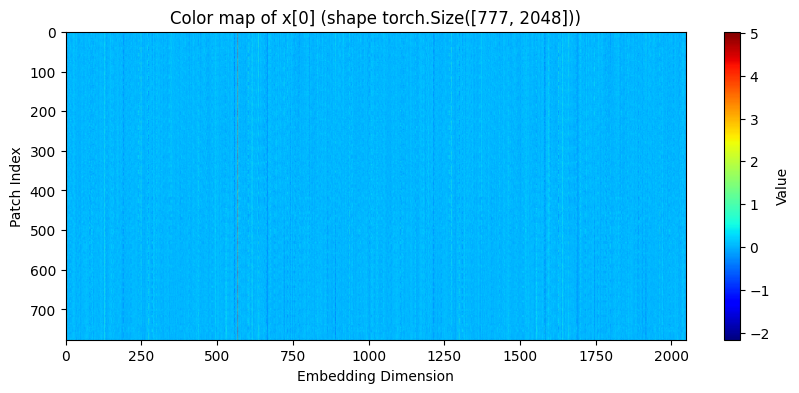

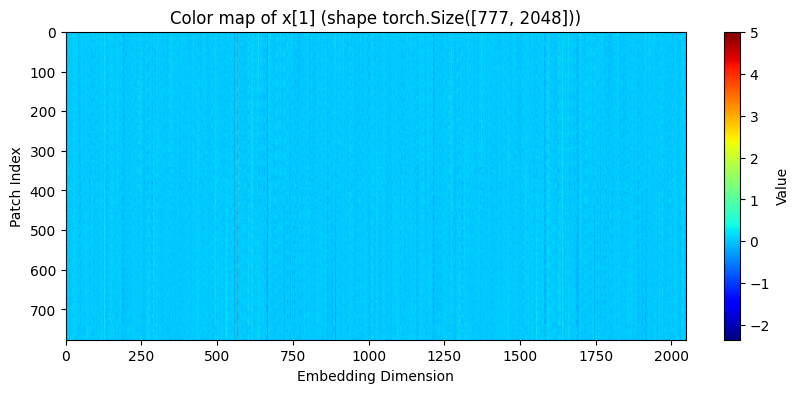

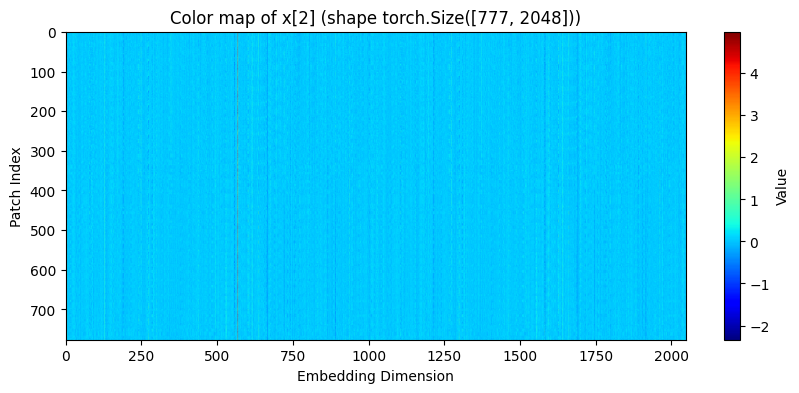

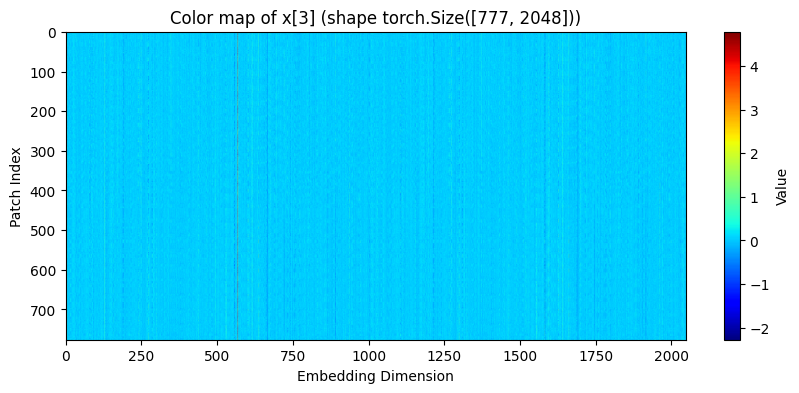

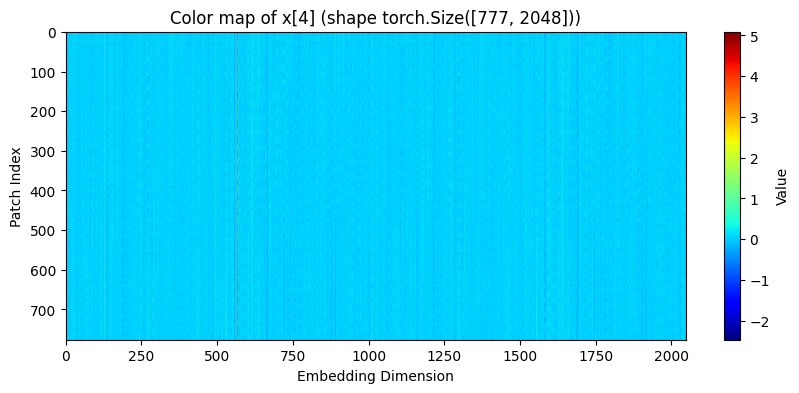

...

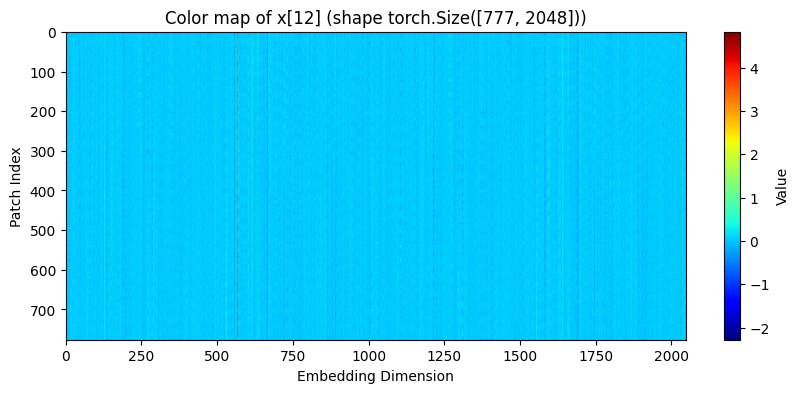

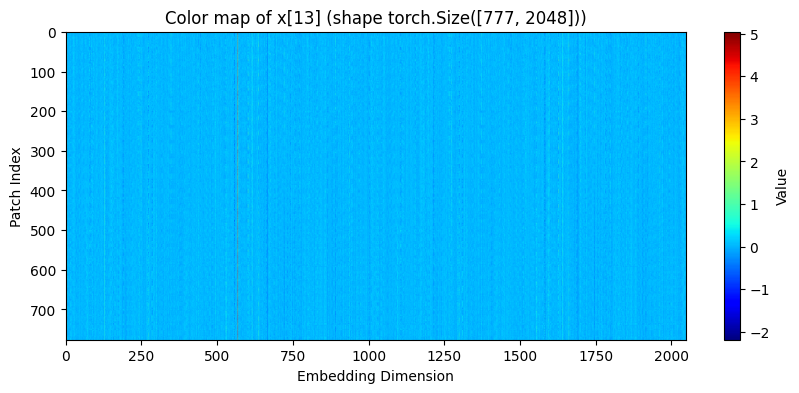

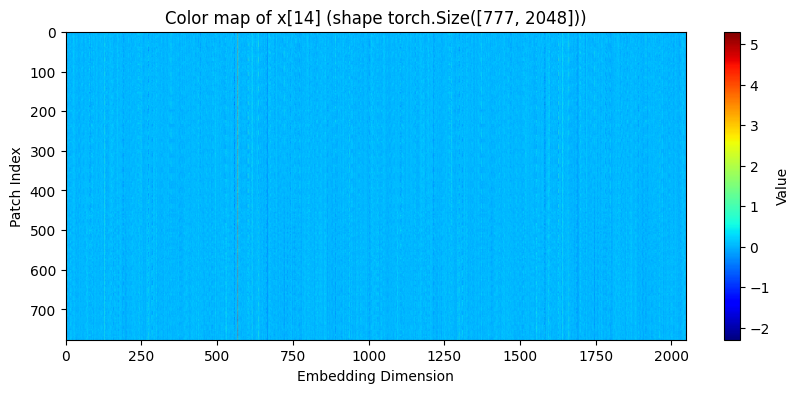

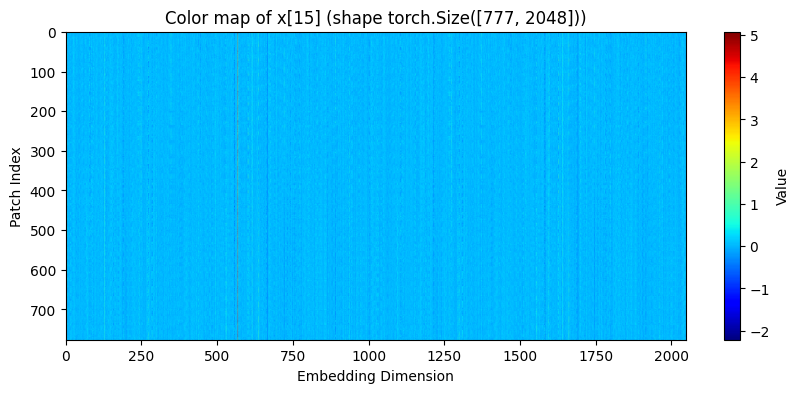

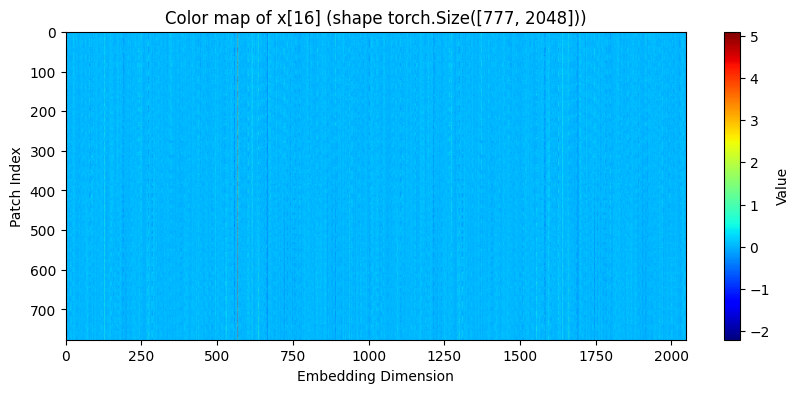

In [ ]:
import matplotlib.pyplot as plt

# x is expected to be a 3D tensor: (S, P, C)
# We'll plot a color map for each x[i] (shape [P, C])
# for i in range(x.shape[0]):
for i in range(2):
    plt.figure(figsize=(10, 4))
    plt.imshow(x[i].cpu().detach().numpy(), aspect='auto', cmap='jet')
    plt.colorbar(label='Value')
    plt.title(f'Color map of x[{i}] (shape {x[i].shape})')
    plt.xlabel('Embedding Dimension')
    plt.ylabel('Patch Index')
    plt.show()


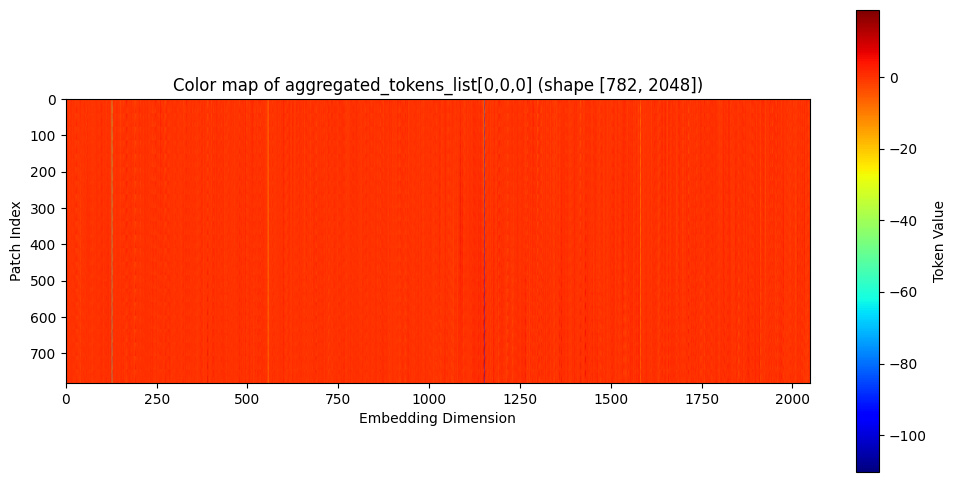

In [13]:
import matplotlib.pyplot as plt

# aggregated_tokens_list[0] has shape [B, S, P, C], e.g. [1, 17, 782, 2048]
# We want the first batch, first sequence: [0,0] -> shape [782, 2048]
tokens = aggregated_tokens_list[-1][0, 0]  # shape [782, 2048]

plt.figure(figsize=(12, 6))
plt.imshow(tokens.cpu().detach().numpy(), cmap='jet')
plt.colorbar(label='Token Value')
plt.title('Color map of aggregated_tokens_list[0,0,0] (shape [782, 2048])')
plt.xlabel('Embedding Dimension')
plt.ylabel('Patch Index')
plt.show()

## solver run predictions

In [5]:
height, width = get_vggt_image_size(image_paths_subset[0:1])
print(f'height: {height}, width: {width}')

height: 294, width: 518


In [6]:
torch.cuda.empty_cache()

###### VGGT-based pose & geometry estimation
predictions = solver.run_predictions(
    image_names   = image_paths_subset, 
    model         = vggt_model, 
    # max_loops     = config['tracking']['max_loops'],
    min_sim_thres = config['tracking']['min_sim_thres'],
)
solver.add_points(predictions)

# solver.graph.optimize()
# solver.map.update_submap_homographies(solver.graph)

torch.cuda.empty_cache()

Preprocessed images shape: torch.Size([17, 3, 294, 518])
Running VGGT inference...


### save depth maps

In [10]:
submap       = solver.map.get_latest_submap()
depths, conf = submap.get_all_depths_confs(ignore_loop_closure_frames=True)

In [11]:
depths.shape

(17, 294, 518, 1)

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

output_dir = './ppt'
os.makedirs(output_dir, exist_ok=True)

# depths: (N, H, W) or (N, H, W, 1)
for i in range(min(5, depths.shape[0])):
    depth = depths[i]
    # Remove singleton channel if present
    if depth.ndim == 3 and depth.shape[-1] == 1:
        depth = depth[..., 0]
    # Normalize depth to [0, 1] for colormap
    dmin, dmax = np.nanmin(depth), np.nanmax(depth)
    if dmax > dmin:
        depth_norm = (depth - dmin) / (dmax - dmin)
    else:
        depth_norm = np.zeros_like(depth)
    # Apply jet colormap
    depth_colored = cm.get_cmap('jet')(depth_norm)[:, :, :3]  # drop alpha
    # Convert to uint8
    depth_colored_uint8 = (depth_colored * 255).astype(np.uint8)
    plt.imsave(os.path.join(output_dir, f'depth_{i:02d}.png'), depth_colored_uint8)

/tmp/ipykernel_59335/3207423755.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  depth_colored = cm.get_cmap('jet')(depth_norm)[:, :, :3]  # drop alpha


## graph

In [27]:
solver.map.get_num_submaps()

4

In [28]:
import copy

graph_before_opt = copy.deepcopy(solver.graph)

In [32]:
graph_before_opt.print_estimates()

Pose 8646911284551352320:
R: [
	1, 5.26606e-21, -8.90075e-21;
	-5.26606e-21, 1, 4.17099e-21;
	8.90075e-21, -4.17099e-21, 1
]
t: -7.89307e-21 -3.99713e-22  1.66201e-21


Pose 8646911284551352321:
R: [
	0.658682, -0.35334, 0.664296;
	0.235263, 0.935326, 0.264227;
	-0.714695, -0.0177573, 0.69921
]
t:   -0.42574 0.00259219   0.101131


Pose 8646911284551352322:
R: [
	0.991239, -0.0230058, 0.130062;
	0.0435744, 0.986543, -0.157591;
	-0.124686, 0.161877, 0.978902
]
t: -0.453317  0.300004 -0.202745


Pose 8646911284551352323:
R: [
	0.361732, -0.470678, 0.804743;
	0.289461, 0.877239, 0.382967;
	-0.886207, 0.09441, 0.453568
]
t:  -0.46071 -0.238928  0.220715




In [30]:
solver.graph.optimize()

In [31]:
solver.graph.print_estimates()

Pose 8646911284551352320:
R: [
	1, 1.12032e-20, -3.12656e-21;
	-1.12032e-20, 1, 4.55753e-21;
	3.12656e-21, -4.55753e-21, 1
]
t: -3.55275e-21  3.40055e-21  -5.1538e-21


Pose 8646911284551352321:
R: [
	0.658449, -0.353507, 0.664438;
	0.23529, 0.935263, 0.264426;
	-0.714901, -0.0177753, 0.699
]
t:  -0.426155 0.00246854   0.100809


Pose 8646911284551352322:
R: [
	0.991177, -0.023155, 0.130509;
	0.0437792, 0.986555, -0.157455;
	-0.125108, 0.16178, 0.978864
]
t:  -0.45428  0.299715 -0.203417


Pose 8646911284551352323:
R: [
	0.361985, -0.468499, 0.8059;
	0.290487, 0.878174, 0.380037;
	-0.885768, 0.0965354, 0.453979
]
t: -0.462257 -0.237374  0.217211




In [58]:
R = solver.graph.get_homography(2).matrix()[:3, :3]
det_R = np.linalg.det(R)
print("Determinant of R:", det_R)

Determinant of R: 1.0000000233839712


In [33]:
graph_old, graph_new = graph_before_opt, solver.graph

In [34]:
for submap_id in solver.map.submaps.keys():
    print(submap_id)
    print(graph_old.get_homography(submap_id).matrix())
    print(graph_new.get_homography(submap_id).matrix())

0
[[ 1.00000000e+00  5.26606178e-21 -8.90074837e-21 -7.89307138e-21]
 [-5.26606178e-21  1.00000000e+00  4.17098517e-21 -3.99712736e-22]
 [ 8.90074837e-21 -4.17098517e-21  1.00000000e+00  1.66200648e-21]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[[ 1.00000000e+00  1.12032175e-20 -3.12655910e-21 -3.55274595e-21]
 [-1.12032175e-20  1.00000000e+00  4.55753199e-21  3.40055405e-21]
 [ 3.12655910e-21 -4.55753199e-21  1.00000000e+00 -5.15379948e-21]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
1
[[ 0.6586819  -0.35333988  0.6642959  -0.42573972]
 [ 0.23526277  0.93532649  0.26422681  0.00259219]
 [-0.71469543 -0.01775731  0.69921036  0.10113115]
 [ 0.          0.          0.          1.        ]]
[[ 0.65844882 -0.35350661  0.66443825 -0.42615454]
 [ 0.23529035  0.93526314  0.26442641  0.00246854]
 [-0.7149011  -0.01777533  0.69899962  0.10080934]
 [ 0.          0.          0.          1.        ]]
2
[[ 0.99123897 -0.02300577  0.13006154 -0.45331

# Keyframe

In [7]:
n_keyframes = 0
mapped_frame_ids = []

In [8]:
from scene.keyframe import Keyframe

###### get keyframes from the current submap
submap       = solver.map.get_latest_submap()
submap_id    = submap.get_id()
num_kfs      = submap.get_len_frames()
frame_ids    = submap.get_frame_ids()
frames       = submap.get_all_frames(ignore_loop_closure_frames=True)
# pointmaps    = submap.get_all_pointmaps(ignore_loop_closure_frames=True).astype(np.float32)
depths, conf = submap.get_all_depths_confs(ignore_loop_closure_frames=True)
poses        = submap.get_all_poses_world2(ignore_loop_closure_frames=True).astype(np.float32)

# get focal length
if submap_id == 0:
    intrinsics = submap.get_all_intrinsics(ignore_loop_closure_frames=True)
    intrinsic = intrinsics[0]
    f = torch.tensor(
        (intrinsic[0, 0] + intrinsic[1, 1]) / 2
    )


keyframes = []

for i in range(num_kfs):
    if frame_ids[i] in mapped_frame_ids:
        continue
    
    ###### keyframing
    keyframe = Keyframe(
        submap_id = submap_id,
        frame_id = frame_ids[i],
        index    = n_keyframes,
        image    = frames[i],
        # pointmap       = torch.from_numpy(pointmaps[i]).cuda(),
        depth      = depths[i],
        depth_conf = conf[i],
        Rt         = np.linalg.inv(poses[i]),
        f          = f,
        config     = config['mapping']
    )
    print(f'keyframe frame_id: {frame_ids[i]}, index: {n_keyframes}')
    n_keyframes += 1
    mapped_frame_ids.append(frame_ids[i])
    
    keyframes.append(keyframe)

keyframe frame_id: 0.0, index: 0
keyframe frame_id: 18.0, index: 1
keyframe frame_id: 30.0, index: 2
keyframe frame_id: 48.0, index: 3
keyframe frame_id: 62.0, index: 4
keyframe frame_id: 79.0, index: 5
keyframe frame_id: 126.0, index: 6
keyframe frame_id: 142.0, index: 7
keyframe frame_id: 154.0, index: 8
keyframe frame_id: 165.0, index: 9
keyframe frame_id: 175.0, index: 10
keyframe frame_id: 190.0, index: 11
keyframe frame_id: 202.0, index: 12
keyframe frame_id: 211.0, index: 13
keyframe frame_id: 221.0, index: 14
keyframe frame_id: 263.0, index: 15
keyframe frame_id: 272.0, index: 16


## save kf pointmap as .ply

In [14]:
kf = keyframes[2]
kf.index

2

In [15]:
import numpy as np

def save_pointcloud_ply(filename, points, colors):
    """
    Save a point cloud to a PLY file.
    Args:
        filename (str): Output filename.
        points (np.ndarray): (N, 3) array of xyz coordinates.
        colors (np.ndarray): (N, 3) array of RGB values in [0, 255].
    """
    n = points.shape[0]
    header = (
        "ply\n"
        "format ascii 1.0\n"
        f"element vertex {n}\n"
        "property float x\n"
        "property float y\n"
        "property float z\n"
        "property uchar red\n"
        "property uchar green\n"
        "property uchar blue\n"
        "end_header\n"
    )
    with open(filename, "w") as f:
        f.write(header)
        for p, c in zip(points, colors):
            f.write(f"{p[0]} {p[1]} {p[2]} {int(c[0])} {int(c[1])} {int(c[2])}\n")


# Prepare data
pointmap = kf.pointmap.detach().cpu().numpy()  # (294, 518, 3)
image = kf.image_pyr[0].detach().cpu().numpy()  # (3, 294, 518)

# Reshape to (N, 3)
points = pointmap.reshape(-1, 3)
colors = np.transpose(image, (1, 2, 0)).reshape(-1, 3) * 255.0
colors = np.clip(colors, 0, 255).astype(np.uint8)

###############
points = (points - keyframe.get_t().detach().cpu().numpy()) @ keyframe.get_R().detach().cpu().numpy()  # from world
###############


# Save to ply
save_pointcloud_ply(f"test/pm{kf.index}.ply", points, colors)

# SceneModel

In [10]:
from scene.scene_model import SceneModel

scene_model = SceneModel(
    width=width, 
    height=height,
    config=config['mapping'],
    # save_path_parent=config['dataset']['save_path_parent']
)

## DoG norm

In [185]:
keyframe = keyframes[10]

img = keyframe.image_pyr[0]  # [3, H, W]
dep = keyframe.get_depth(0)  # [1, H, W]

dog_proba_img = get_dog_norm(img, scene_model.disc_kernel, sigma1=0.5, sigma2=1.5)  # [H, W]
dog_proba_dep = get_dog_norm(dep, scene_model.disc_kernel, sigma1=0.5, sigma2=1.5)  # [H, W]
dog_proba = dog_proba_img + dog_proba_dep

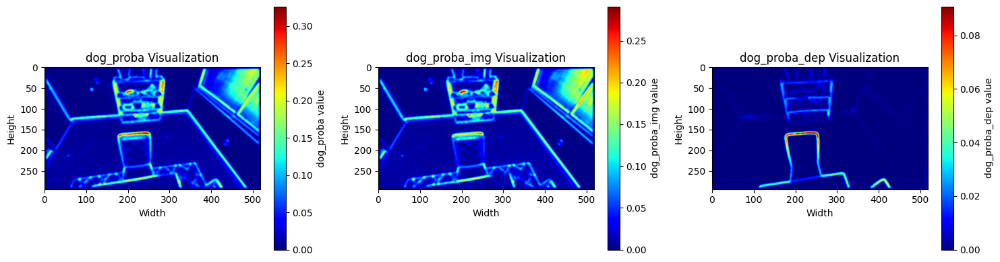

In [186]:
plt.figure(figsize=(15, 4))

plt.subplot(1, 3, 1)
plt.imshow(dog_proba.cpu().detach().numpy(), cmap='jet')
plt.colorbar(label='dog_proba value')
plt.title('dog_proba Visualization')
plt.xlabel('Width')
plt.ylabel('Height')

plt.subplot(1, 3, 2)
plt.imshow(dog_proba_img.cpu().detach().numpy(), cmap='jet')
plt.colorbar(label='dog_proba_img value')
plt.title('dog_proba_img Visualization')
plt.xlabel('Width')
plt.ylabel('Height')

plt.subplot(1, 3, 3)
plt.imshow(dog_proba_dep.cpu().detach().numpy(), cmap='jet')
plt.colorbar(label='dog_proba_dep value')
plt.title('dog_proba_dep Visualization')
plt.xlabel('Width')
plt.ylabel('Height')

plt.tight_layout()
plt.show()

In [187]:
dog_proba.cpu().detach().numpy().mean()

0.033993095

In [188]:
dog_proba *= 6
penalty = 0

# ==========================================
sample_mask = torch.rand_like(dog_proba) < (dog_proba - penalty)  # eq. 3, [H, W]
sampled_uv = scene_model.uv[sample_mask]  # [N0, 2]

In [189]:
sample_mask.cpu().detach().numpy().mean()

0.200023638799149

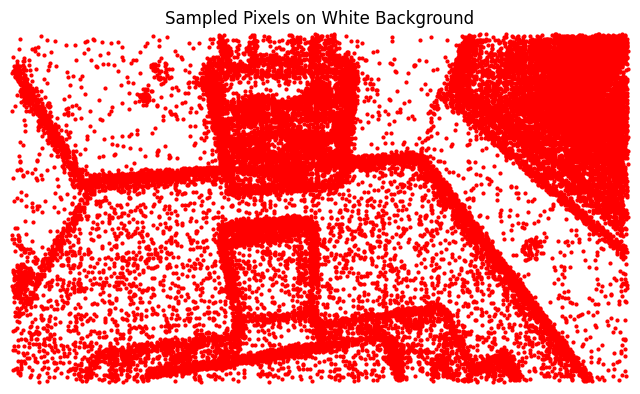

In [190]:
plt.figure(figsize=(8, 6))
h, w = img.shape[1], img.shape[2]
plt.imshow(np.ones((h, w, 3)))  # white background

uv_np = sampled_uv.detach().cpu().numpy()
plt.scatter(uv_np[:, 0], uv_np[:, 1], c='red', s=4, marker='o')
plt.title("Sampled Pixels on White Background")
plt.axis('off')
plt.show()

## test Gaussian primitive sampling 

In [72]:
scene_model.disc_kernel.shape

torch.Size([1, 1, 7, 7])

In [160]:
keyframe = keyframes[10]

from utils import get_lapla_norm

###### Get the pixel-wise probability to add a Gaussian
img = keyframe.image_pyr[0]  # [3, H, W]
dep = keyframe.get_depth(0)  # [1, H, W]

init_proba_img = get_lapla_norm(img, scene_model.disc_kernel)  # eq. 1, [H, W]
init_proba_dep = get_lapla_norm(dep, scene_model.disc_kernel)  # eq. 1, [H, W]

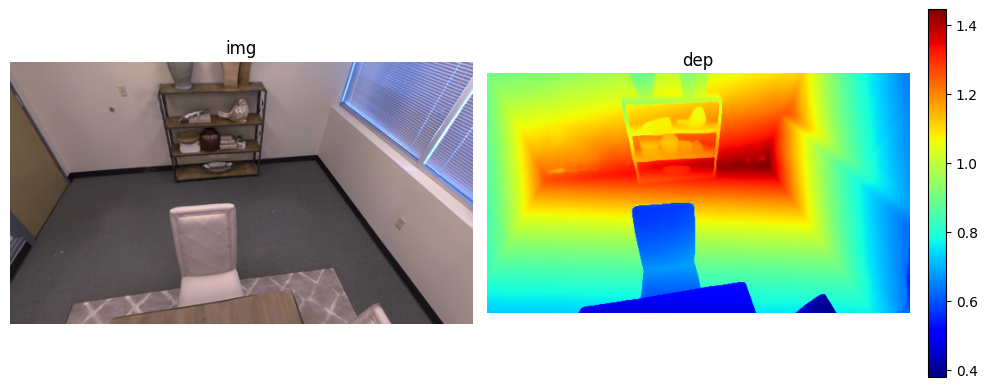

In [161]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.title("img")
plt.imshow(img.permute(1, 2, 0).detach().cpu().numpy())
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("dep")
im = plt.imshow(dep[0].detach().cpu().numpy(), cmap='jet')
plt.axis('off')
plt.colorbar(im, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

In [162]:
init_proba = init_proba_img + init_proba_dep

### breakdown of get_lapla_norm

In [64]:
laplacian_kernel = (
    torch.tensor(
        [
            [0, 1, 0], 
            [1, -4, 1],
            [0, 1, 0]
        ], 
        device="cuda", dtype=torch.float32
    )
    .unsqueeze(0)
    .unsqueeze(0)
)
print(f'laplacian_kernel.shape: {laplacian_kernel.shape}')

laplacian_kernel.shape: torch.Size([1, 1, 3, 3])


In [65]:
laplacian_kernel = laplacian_kernel.repeat(1, img.shape[0], 1, 1)
print(f'laplacian_kernel.shape: {laplacian_kernel.shape}')

laplacian_kernel.shape: torch.Size([1, 3, 3, 3])


In [66]:
import torch.nn.functional as F
laplacian = F.conv2d(
    img[None], 
    laplacian_kernel, 
    padding="same"
)
print(f'laplacian.shape: {laplacian.shape}')

laplacian.shape: torch.Size([1, 1, 294, 518])


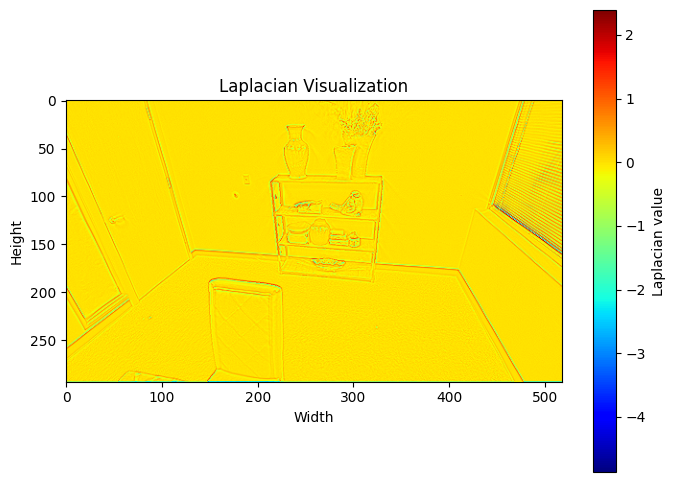

In [67]:
plt.figure(figsize=(8, 6))
plt.imshow(laplacian[0].permute(1, 2, 0).detach().cpu().numpy(), cmap='jet')
plt.colorbar(label='Laplacian value')
plt.title('Laplacian Visualization')
plt.xlabel('Width')
plt.ylabel('Height')
plt.show()

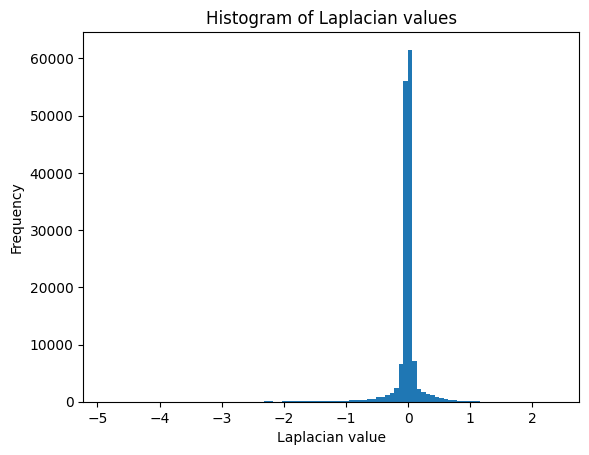

In [68]:
plt.hist(laplacian.cpu().numpy().flatten(), bins=100)
plt.xlabel("Laplacian value")
plt.ylabel("Frequency")
plt.title("Histogram of Laplacian values")
plt.show()

In [69]:
laplacian_norm = torch.linalg.vector_norm(laplacian, ord=1, dim=1, keepdim=True)
laplacian_norm[..., :, 0] = 0
laplacian_norm[..., :, -1] = 0
laplacian_norm[..., 0, :] = 0
laplacian_norm[..., -1, :] = 0
print(f'laplacian_norm.shape: {laplacian_norm.shape}')

laplacian_norm.shape: torch.Size([1, 1, 294, 518])


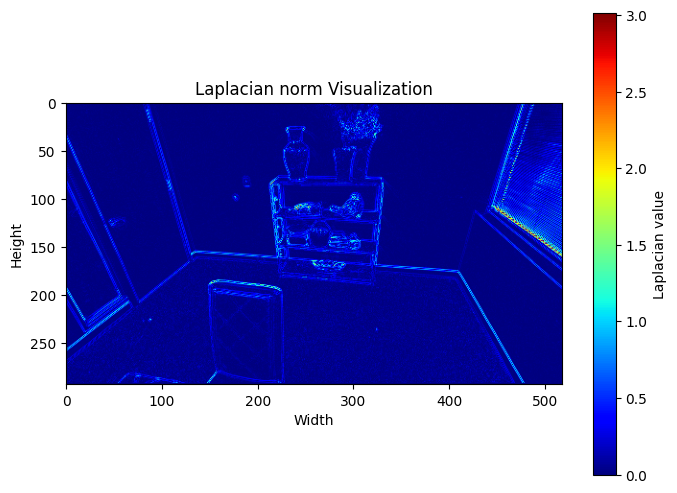

In [70]:
plt.figure(figsize=(8, 6))
plt.imshow(laplacian_norm[0].permute(1, 2, 0).detach().cpu().numpy(), cmap='jet')
plt.colorbar(label='Laplacian value')
plt.title('Laplacian norm Visualization')
plt.xlabel('Width')
plt.ylabel('Height')
plt.show()

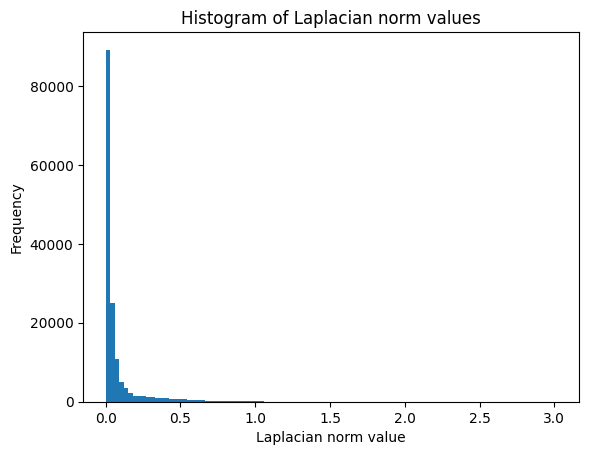

In [78]:
plt.hist(laplacian_norm.cpu().numpy().flatten(), bins=100)
plt.xlabel("Laplacian norm value")
plt.ylabel("Frequency")
plt.title("Histogram of Laplacian norm values")
plt.show()

In [82]:
init_proba = F.conv2d(
    laplacian_norm, 
    scene_model.disc_kernel, 
    padding="same"
)[0, 0].clamp(0, 1)
print(f'init_proba.shape: {init_proba.shape}')

init_proba.shape: torch.Size([294, 518])


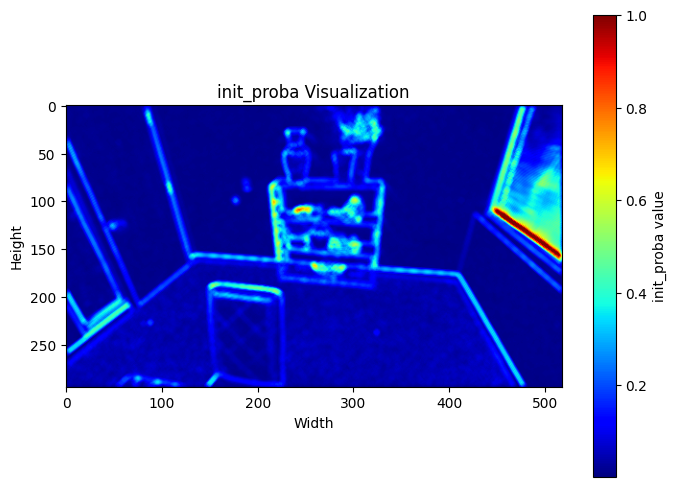

In [83]:
plt.figure(figsize=(8, 6))
plt.imshow(init_proba.cpu().numpy(), cmap='jet')
plt.colorbar(label='init_proba value')
plt.title('init_proba Visualization')
plt.xlabel('Width')
plt.ylabel('Height')
plt.show()

### visualize LoG norm result init_proba

In [163]:
init_proba.shape

torch.Size([294, 518])

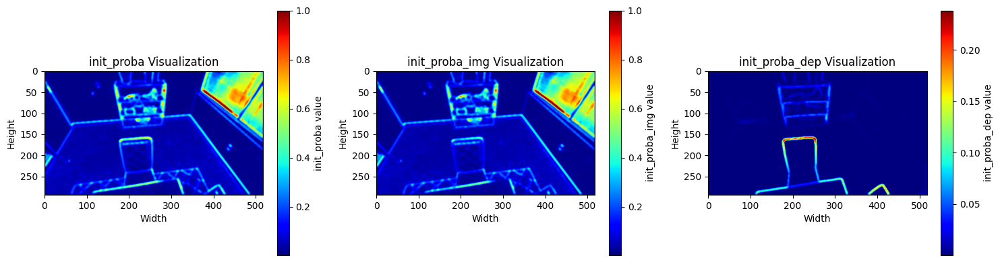

In [164]:
plt.figure(figsize=(15, 4))

plt.subplot(1, 3, 1)
plt.imshow(init_proba.cpu().detach().numpy(), cmap='jet')
plt.colorbar(label='init_proba value')
plt.title('init_proba Visualization')
plt.xlabel('Width')
plt.ylabel('Height')

plt.subplot(1, 3, 2)
plt.imshow(init_proba_img.cpu().detach().numpy(), cmap='jet')
plt.colorbar(label='init_proba_img value')
plt.title('init_proba_img Visualization')
plt.xlabel('Width')
plt.ylabel('Height')

plt.subplot(1, 3, 3)
plt.imshow(init_proba_dep.cpu().detach().numpy(), cmap='jet')
plt.colorbar(label='init_proba_dep value')
plt.title('init_proba_dep Visualization')
plt.xlabel('Width')
plt.ylabel('Height')

plt.tight_layout()
plt.show()

In [165]:
###### Define which pixels should become Gaussians
init_proba *= scene_model.init_proba_scaler
# penalty *= scene_model.init_proba_scaler
penalty = 0

# ==========================================
sample_mask = torch.rand_like(init_proba) < (init_proba - penalty)  # eq. 3, [H, W]
# sample_mask = torch.ones_like(init_proba, dtype=torch.bool)  # test: sample all pixels

sampled_uv = scene_model.uv[sample_mask]  # [N0, 2]
# ==========================================

In [166]:
init_proba.cpu().detach().numpy().mean()

0.23692684

In [167]:
sample_mask.shape, sample_mask.cpu().numpy().mean()

(torch.Size([294, 518]), 0.22147584902686943)

In [168]:
sampled_uv.shape, sampled_uv.shape[0] / (sample_mask.shape[0] * sample_mask.shape[1])

(torch.Size([33729, 2]), 0.22147584902686943)

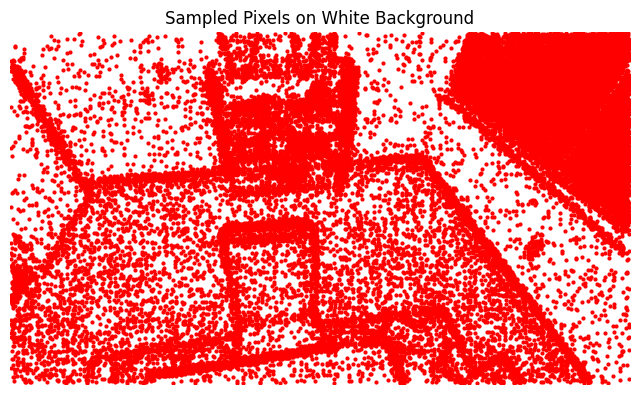

In [169]:
plt.figure(figsize=(8, 6))
h, w = img.shape[1], img.shape[2]
plt.imshow(np.ones((h, w, 3)))  # white background

uv_np = sampled_uv.detach().cpu().numpy()
plt.scatter(uv_np[:, 0], uv_np[:, 1], c='red', s=4, marker='o')
plt.title("Sampled Pixels on White Background")
plt.axis('off')
plt.show()

### test other sampling methods

#### SIFT

In [18]:
img.shape

torch.Size([3, 294, 518])

In [19]:
import cv2

# Convert img (PyTorch tensor, shape [3, H, W], values in [0,1]) to cv2.imread-like format (numpy array, shape [H, W, 3], dtype=uint8, BGR)
img_cv2 = (img.permute(1, 2, 0).detach().cpu().numpy() * 255).astype(np.uint8)
img_cv2 = cv2.cvtColor(img_cv2, cv2.COLOR_RGB2BGR)

# Convert PyTorch tensor img ([3, H, W], float, [0,1]) to grayscale numpy array ([H, W], uint8)
img_gray = cv2.cvtColor(img_cv2, cv2.COLOR_BGR2GRAY)

In [21]:
import pysift

keypoints, descriptors = pysift.computeKeypointsAndDescriptors(img_gray)

In [26]:
len(keypoints), keypoints[0].pt[0], keypoints[0].pt[1]

(233, 10.22822380065918, 113.55918884277344)

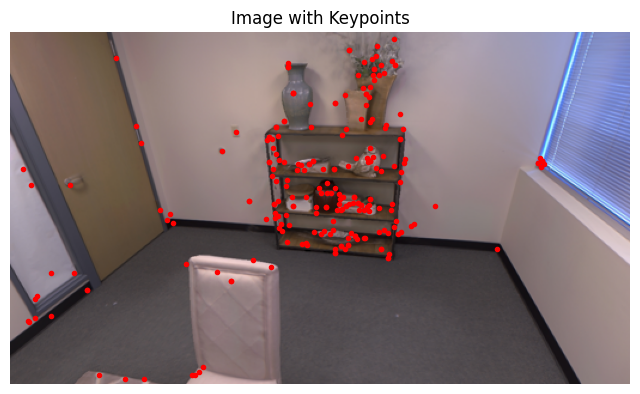

In [25]:
plt.figure(figsize=(8, 6))
plt.imshow(img.permute(1, 2, 0).detach().cpu().numpy())
for kp in keypoints:
    x, y = kp.pt
    plt.plot(x, y, 'ro', markersize=3)
plt.title("Image with Keypoints")
plt.axis('off')
plt.show()

#### LoG, DoG, DoH blob detection

In [59]:
from math import sqrt
from skimage import data
from skimage.feature import blob_log, blob_dog, blob_doh
from skimage.color import rgb2gray

import matplotlib.pyplot as plt

In [60]:
import cv2

# Convert img (PyTorch tensor, shape [3, H, W], values in [0,1]) to cv2.imread-like format (numpy array, shape [H, W, 3], dtype=uint8, BGR)
img_cv2 = (img.permute(1, 2, 0).detach().cpu().numpy() * 255).astype(np.uint8)
img_cv2 = cv2.cvtColor(img_cv2, cv2.COLOR_RGB2BGR)

# Convert PyTorch tensor img ([3, H, W], float, [0,1]) to grayscale numpy array ([H, W], uint8)
img_gray = cv2.cvtColor(img_cv2, cv2.COLOR_BGR2GRAY)

In [61]:
img_gray.shape

(294, 518)

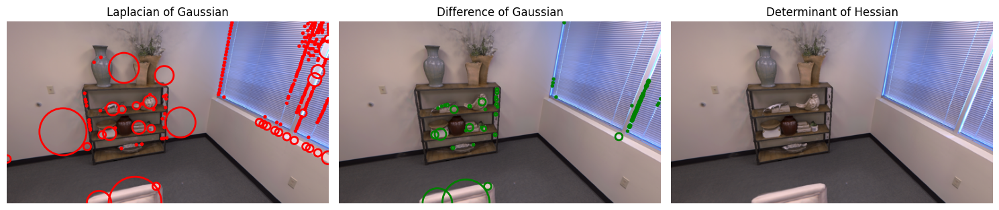

In [62]:
blobs_log = blob_log(img_gray, max_sigma=30, num_sigma=10, threshold=0.1)
# Compute radii in the 3rd column.
blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2)

blobs_dog = blob_dog(img_gray, max_sigma=30, threshold=0.1)
blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)

blobs_doh = blob_doh(img_gray, max_sigma=30, threshold=0.01)


blobs_list = [blobs_log, blobs_dog, blobs_doh]
colors = ['red', 'green', 'blue']
titles = ['Laplacian of Gaussian', 'Difference of Gaussian', 'Determinant of Hessian']
sequence = zip(blobs_list, colors, titles)

fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharex=True, sharey=True)
ax = axes.ravel()

for idx, (blobs, color, title) in enumerate(sequence):
    ax[idx].set_title(title)
    ax[idx].imshow(img.permute(1, 2, 0).detach().cpu().numpy())
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
        ax[idx].add_patch(c)
    ax[idx].set_axis_off()

plt.tight_layout()
plt.show()

In [40]:
blobs_log.shape, blobs_dog.shape, blobs_doh.shape

((101, 3), (66, 3), (0, 3))

## add keyframes, add Gaussians, and optimization

In [11]:
for keyframe in keyframes:
    scene_model.add_keyframe(
        keyframe=keyframe, 
        f=f if keyframe.index == 0 else None
    )
    scene_model.add_new_gaussians()
    
    scene_model.optimization_loop(config['mapping']['num_iterations'])
    # scene_model.place_anchor_if_needed()  ###
    
print(f'len(scene_model.keyframes): {len(scene_model.keyframes)}')

len(scene_model.keyframes): 17


### test _prune_redundant_gaussians_after_loop_closure

In [ ]:
from simple_knn._C import distIndex2

valid_xyz = scene_model.xyz
# Find clusters of nearby Gaussians using KNN
k = 5  # Look at 5 nearest neighbors
_, nn_idx = distIndex2(valid_xyz, k)
nn_idx = nn_idx.view(-1, k)

In [ ]:
nn_idx.shape, valid_xyz.shape

(torch.Size([81063, 5]), torch.Size([81063, 3]))

In [ ]:
nn_idx

tensor([[39996, 40205, 39799, 39876,    22],
        [41052, 40977,    24, 52848, 48515],
        [41102,    27,     3,    13,    53],
        ...,
        [76329, 70533, 70478, 81045, 76341],
        [76406, 76405, 74571, 76399, 76400],
        [73840, 81047, 81057, 81046, 81054]], device='cuda:0',
       dtype=torch.int32)

In [ ]:
nn_xyz = valid_xyz[nn_idx]

In [ ]:
nn_xyz.shape

torch.Size([81063, 5, 3])

In [ ]:
distances = torch.linalg.norm(
    valid_xyz.unsqueeze(1) - nn_xyz, 
    dim=-1
)

In [24]:
distances.shape

torch.Size([81063, 5])

In [25]:
distances

tensor([[0.0046, 0.0063, 0.0113, 0.0092, 0.0097],
        [0.0092, 0.0084, 0.0107, 0.0110, 0.0115],
        [0.0091, 0.0060, 0.0101, 0.0104, 0.0078],
        ...,
        [0.0040, 0.0068, 0.0059, 0.0067, 0.0050],
        [0.0037, 0.0037, 0.0028, 0.0011, 0.0011],
        [0.0093, 0.0098, 0.0099, 0.0105, 0.0086]], device='cuda:0',
       grad_fn=<LinalgVectorNormBackward0>)

In [ ]:
distance_threshold = 0.1  # meters - Gaussians closer than this are considered redundant

In [27]:
# Find Gaussians that are too close to their neighbors
close_neighbors = distances < distance_threshold
redundant_mask = close_neighbors.sum(dim=1) > 1  # More than 1 close neighbor

In [28]:
close_neighbors.shape, redundant_mask.shape

(torch.Size([81063, 5]), torch.Size([81063]))

In [34]:
close_neighbors

tensor([[True, True, True, True, True],
        [True, True, True, True, True],
        [True, True, True, True, True],
        ...,
        [True, True, True, True, True],
        [True, True, True, True, True],
        [True, True, True, True, True]], device='cuda:0')

In [33]:
redundant_mask

tensor([True, True, True,  ..., True, True, True], device='cuda:0')

In [29]:
redundant_mask.any()

tensor(True, device='cuda:0')

In [30]:
redundant_indices = torch.where(redundant_mask)[0]

In [31]:
redundant_indices.shape

torch.Size([81062])

In [32]:
redundant_indices

tensor([    0,     1,     2,  ..., 81060, 81061, 81062], device='cuda:0')

In [35]:
# Find all Gaussians in this cluster

redundant_idx = redundant_indices[0]
cluster_mask = close_neighbors[redundant_idx]  # [5,]
cluster_indices = torch.where(cluster_mask)[0]

In [37]:
cluster_indices

tensor([0, 1, 2, 3, 4], device='cuda:0')

## 1 add_keyframe

In [11]:
keyframe = keyframes[0]
print(f'keyframe.index: {keyframe.index}')

keyframe.index: 0


In [12]:
scene_model.add_keyframe(
    keyframe=keyframe, 
    f=f if keyframe.index == 0 else None
)
print(len(scene_model.keyframes))

1


## 2 add_new_gaussians

In [ ]:
# scene_model.add_new_gaussians()

### add_new_gaussians breakdown

In [13]:
import torch.nn.functional as F
from utils import (
    RGB2SH,
    depth2points,
    focal2fov,
    get_lapla_norm,
    getProjectionMatrix,
    inverse_sigmoid,
    align_poses,
    make_torch_sampler,
    psnr,
    rotation_distance,
)

keyframe_id = -1
keyframe.create_depth_pyr()

In [14]:
###### Get the pixel-wise probability to add a Gaussian
img = keyframe.image_pyr[0]  # [3, H, W]
# img = F.avg_pool2d(img, 2)
# img = F.interpolate(
#     img[None], 
#     (self.height, self.width), 
#     mode="bilinear", 
#     align_corners=True
# )[0]
init_proba = get_lapla_norm(img, scene_model.disc_kernel)  # eq. 1

###### Compute the penalty based on the rendering from the new keyframe's point of view
penalty = 0
rendered_depth = None
if scene_model.xyz.shape[0] > 0:
    render_pkg = scene_model.render_from_id(keyframe_id)
    render = render_pkg["render"]
    rendered_depth = 1 / render_pkg["invdepth"][0].clamp_min(1e-8)
    penalty = get_lapla_norm(render, scene_model.disc_kernel)  # eq. 2

###### Define which pixels should become Gaussians
init_proba *= scene_model.init_proba_scaler
penalty *= scene_model.init_proba_scaler

sample_mask = torch.rand_like(init_proba) < init_proba - penalty  # eq. 3
sampled_uv = scene_model.uv[sample_mask]

In [15]:
img.shape

torch.Size([3, 294, 518])

In [17]:
print(f'init_proba.shape: {init_proba.shape}')
print(f'scene_model.uv.shape: {scene_model.uv.shape}')
print(f'sample_mask.shape: {sample_mask.shape}')
print(f'sampled_uv.shape: {sampled_uv.shape}')

init_proba.shape: torch.Size([294, 518])
scene_model.uv.shape: torch.Size([294, 518, 2])
sample_mask.shape: torch.Size([294, 518])
sampled_uv.shape: torch.Size([22978, 2])


In [25]:
###### Initialize positions
depth_map = keyframe.depth.squeeze()  # shape: [H, W]
# sampled_uv is (N, 2) with (x, y) in pixel coordinates (float), need to convert to long for indexing
u = sampled_uv.cpu()[:, 0].int()
v = sampled_uv.cpu()[:, 1].int()
# Get depth values at those UVs
depth = depth_map[v, u]
accurate_mask = torch.ones_like(depth, dtype=torch.bool)
print(f'depth.shape: {depth.shape}')
print(f'accurate_mask.shape: {accurate_mask.shape}')

depth.shape: torch.Size([22978])
accurate_mask.shape: torch.Size([22978])


In [26]:
valid_mask = (keyframe.sample_conf(sampled_uv) > 0.5) * (depth > 1e-6)
sample_mask[sample_mask.clone()] = valid_mask
depth = depth[valid_mask]
sampled_uv = sampled_uv[valid_mask]
accurate_mask = accurate_mask[valid_mask]

print(f'valid_mask.shape: {valid_mask.shape}')
print(f'sample_mask.shape: {sample_mask.shape}')
print(f'depth.shape: {depth.shape}')
print(f'sampled_uv.shape: {sampled_uv.shape}')
print(f'accurate_mask.shape: {accurate_mask.shape}')

valid_mask.shape: torch.Size([22978])
sample_mask.shape: torch.Size([294, 518])
depth.shape: torch.Size([22978])
sampled_uv.shape: torch.Size([22978, 2])
accurate_mask.shape: torch.Size([22978])


In [ ]:
# Remove Gaussians that are coarser than the newpoints
# if len(self.xyz) > 0:


# Check for occlusions
# if rendered_depth is not None:



In [27]:
# Get the samples' 3D positions
new_pts = depth2points(
    sampled_uv, 
    depth.unsqueeze(-1),
    scene_model.f, 
    scene_model.centre
)  # from camera
new_pts = (new_pts - keyframe.get_t()) @ keyframe.get_R()  # from world
# Add points from matching
# match_pts = keyframe.desc_kpts.pts3d[keyframe.desc_kpts.has_pt3d]
# new_pts = torch.cat([new_pts, match_pts], dim=0)
print(f'new_pts.shape: {new_pts.shape}')

new_pts.shape: torch.Size([22978, 3])


In [33]:
pointmap = keyframe.pointmap  # [H, W, 3]
u = sampled_uv.cpu()[:, 0].int()
v = sampled_uv.cpu()[:, 1].int()
new_pts = pointmap[v, u, :]  # from camera
# new_pts = (new_pts - keyframe.get_t()) @ keyframe.get_R()  # from world

In [35]:
pointmap.dtype

torch.float64

In [31]:
new_pts.shape

torch.Size([22978, 3])

In [ ]:
## Initialize Colour
f_dc = img[:, sample_mask]
# match_sampler = keyframe.desc_kpts.kpts[keyframe.desc_kpts.has_pt3d]
# match_sampler = make_torch_sampler(match_sampler, self.width, self.height)
# match_colors = F.grid_sample(
#     img[None],
#     match_sampler[None, None],
#     mode="bilinear",
#     align_corners=True,
# ).view(3, -1)
# f_dc = torch.cat([f_dc, match_colors], dim=1)
f_dc = RGB2SH(f_dc.permute(1, 0).unsqueeze(1))
print(f'f_dc.shape: {f_dc.shape}')

In [ ]:
f_dc.requires_grad

In [ ]:
## Initialize Scales
sampled_init_proba = init_proba[sample_mask]
# match_init_proba = F.grid_sample(
#     init_proba[None, None],
#     match_sampler[None, None],
#     mode="bilinear",
#     align_corners=True,
# ).view(-1)
# sampled_init_proba = torch.cat([sampled_init_proba, match_init_proba], dim=0)

# Expected distance to the nearest neighbour (eq. 4)
scales = 1 / (torch.sqrt(sampled_init_proba))
scales.clamp_(1, scene_model.width / 10)
# Scale by the distance to the camera centre
scales.mul_(1 / scene_model.f)
scales *= torch.linalg.vector_norm(
    new_pts - keyframe.approx_centre[None], dim=-1
)
scales = torch.log(scales.clamp(1e-6, 1e6)).unsqueeze(-1).repeat(1, 3)
print(f'scales.shape: {scales.shape}')

In [ ]:
scales.requires_grad

In [ ]:
## Initialize opacities
opacities = torch.ones(f_dc.shape[0], 1, device="cuda")
# Lower inital opacity depending for innacurate points
opacities[: sampled_uv.shape[0]] *= (
    0.07 * accurate_mask[..., None] + 0.02 * ~accurate_mask[..., None]
)
# High opacity for triangulated Gaussians
opacities[sampled_uv.shape[0] :] *= 0.2
opacities = inverse_sigmoid(opacities)
print(f'opacities.shape: {opacities.shape}')

In [ ]:
opacities.requires_grad

In [ ]:
## Initialize SH, rotations as identity
f_rest = torch.zeros(
    f_dc.shape[0],
    (scene_model.max_sh_degree + 1) * (scene_model.max_sh_degree + 1) - 1,
    3,
    device="cuda",
)
rots = torch.zeros(f_dc.shape[0], 4, device="cuda")
rots[:, 0] = 1
print(f'f_rest.shape: {f_rest.shape}')
print(f'rots.shape: {rots.shape}')

In [ ]:
f_rest.requires_grad

In [ ]:
rots.requires_grad

In [ ]:
## Get which Gaussians should be pruned
# if self.xyz.shape[0] > 0:
#     # Only keep Gaussians with non neglectible opacity
#     valid_gs_mask = self.opacity[:, 0] > 0.05

#     # Discard huge Gaussians
#     dist = torch.linalg.vector_norm(
#         self.xyz - keyframe.approx_centre[None], 
#         dim=-1
#     )
#     screen_size = self.f * self.scaling.max(dim=-1)[0] / dist
#     valid_gs_mask *= screen_size < 0.5 * self.width
# else:
valid_gs_mask = torch.ones(0, device="cuda", dtype=torch.bool)
print(f'valid_gs_mask.shape: {valid_gs_mask.shape}')

In [ ]:
## Append the new Gaussians
extension_tensors = {
    "xyz": new_pts,
    "f_dc": f_dc,
    "f_rest": f_rest,
    "opacity": opacities,
    "scaling": scales,
    "rotation": rots,
}

In [ ]:
with scene_model.lock:
    scene_model.optimizer.add_and_prune(extension_tensors, valid_gs_mask)

In [ ]:
print(scene_model.gaussian_params['xyz']["val"].shape)
print(scene_model.gaussian_params['f_dc']["val"].shape)
print(scene_model.gaussian_params['f_rest']["val"].shape)
print(scene_model.gaussian_params['scaling']["val"].shape)
print(scene_model.gaussian_params['rotation']["val"].shape)
print(scene_model.gaussian_params['opacity']["val"].shape)

## 3 optimization_loop

In [ ]:
scene_model.optimization_loop(config['mapping']['num_iterations'])

## render test

In [ ]:
import matplotlib.pyplot as plt

# Render image and depth
rendered_images = []
rendered_depths = []

for keyframe_id in range(len(scene_model.keyframes)):
    render_pkg = scene_model.render_from_id(
        keyframe_id=keyframe_id, 
        pyr_lvl=0,
        # bg=torch.rand(3, device="cuda")
    )
    rendered_image = render_pkg["render"]
    rendered_depth = 1 / render_pkg["invdepth"][0].clamp_min(1e-8)

    rendered_images.append(rendered_image)
    rendered_depths.append(rendered_depth)

    if keyframe_id == 0:
        print(f'rendered_image.shape: {rendered_image.shape}')
        print(f'rendered_depth.shape: {rendered_depth.shape}')
    
print(f'len(rendered_images): {len(rendered_images)}')
print(f'len(rendered_depths): {len(rendered_depths)}')

rendered_image.shape: torch.Size([3, 294, 518])
rendered_depth.shape: torch.Size([294, 518])
len(rendered_images): 17
len(rendered_depths): 17


In [14]:
import os

save_dir = 'ppt/rendered'
os.makedirs(save_dir, exist_ok=True)

for i in range(min(5, len(rendered_images))):
    img = rendered_images[i].detach().cpu()
    depth = rendered_depths[i].detach().cpu()

    # Save image
    img_np = (img.permute(1, 2, 0).clamp(0, 1).numpy() * 255).astype('uint8')
    img_path = os.path.join(save_dir, f"rendered_image_{i}.png")
    plt.imsave(img_path, img_np)

    # Save depth (normalize for visualization)
    depth_np = depth.numpy()
    depth_min, depth_max = depth_np.min(), depth_np.max()
    if depth_max > depth_min:
        depth_norm = (depth_np - depth_min) / (depth_max - depth_min)
    else:
        depth_norm = depth_np
    depth_path = os.path.join(save_dir, f"rendered_depth_{i}.png")
    plt.imsave(depth_path, depth_norm, cmap='jet')


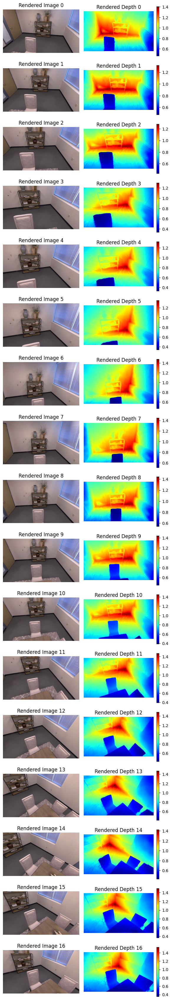

In [13]:
fig, axes = plt.subplots(len(rendered_images), 2, figsize=(6, 2 * len(rendered_images)))

for i, (img, depth) in enumerate(zip(rendered_images, rendered_depths)):
    if len(rendered_images) == 1:
        # Rendered image
        axes[0].imshow(img.permute(1, 2, 0).detach().cpu().numpy())
        axes[0].set_title(f"Rendered Image {i}")
        axes[0].axis('off')
        # Depth map
        im = axes[1].imshow(depth.detach().cpu().numpy(), cmap='jet')
        axes[1].set_title(f"Rendered Depth {i}")
        axes[1].axis('off')
        plt.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
    else:
        # Rendered image
        axes[i, 0].imshow(img.permute(1, 2, 0).detach().cpu().numpy())
        axes[i, 0].set_title(f"Rendered Image {i}")
        axes[i, 0].axis('off')
        # Depth map
        im = axes[i, 1].imshow(depth.detach().cpu().numpy(), cmap='jet')
        axes[i, 1].set_title(f"Rendered Depth {i}")
        axes[i, 1].axis('off')
        plt.colorbar(im, ax=axes[i, 1], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

In [15]:
gt_images = []
gt_depths = []

for keyframe in scene_model.keyframes:
    # lvl = keyframe.pyr_lvl
    lvl = 0
    
    gt_image = keyframe.image_pyr[lvl]
    gt_depth = keyframe.get_depth(lvl)
    # print(f'gt_image.shape: {gt_image.shape}')
    # print(f'gt_depth.shape: {gt_depth.shape}')

    gt_images.append(gt_image)
    gt_depths.append(gt_depth)

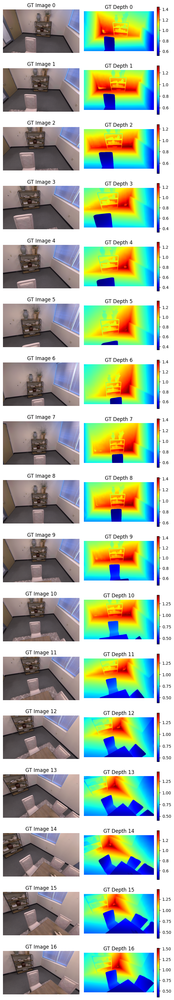

In [16]:
fig, axes = plt.subplots(len(gt_images), 2, figsize=(6, 2 * len(gt_images)))

for i, (img, depth) in enumerate(zip(gt_images, gt_depths)):
    if len(gt_images) == 1:
        # Image
        axes[0].imshow(img.permute(1, 2, 0).detach().cpu().numpy())
        axes[0].set_title(f"GT Image {i}")
        axes[0].axis('off')
        # Depth map
        im = axes[1].imshow(depth.squeeze().detach().cpu().numpy(), cmap='jet')
        axes[1].set_title(f"GT Depth {i}")
        axes[1].axis('off')
        plt.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
    else:
        # Image
        axes[i, 0].imshow(img.permute(1, 2, 0).detach().cpu().numpy())
        axes[i, 0].set_title(f"GT Image {i}")
        axes[i, 0].axis('off')
        # Depth map
        im = axes[i, 1].imshow(depth.squeeze().detach().cpu().numpy(), cmap='jet')
        axes[i, 1].set_title(f"GT Depth {i}")
        axes[i, 1].axis('off')
        plt.colorbar(im, ax=axes[i, 1], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

### psnr, ssim, lpips

In [19]:
from utils import (
    psnr,
)
from fused_ssim import fused_ssim
import lpips
lpips_ = lpips.LPIPS(net="alex").cuda()


psnr_list = []
ssim_list = []
lpips_list = []

for i in range(len(rendered_images)):
    image = rendered_images[i]
    gt_image = gt_images[i]
    
    psnr_list.append(
        psnr(image, gt_image)
    )
    ssim_list.append(
        fused_ssim(
            image[None], 
            gt_image[None], 
            train=False
        ).item()
    )
    lpips_list.append(
        lpips_(
            image[None], 
            gt_image[None],
            ########################################
            normalize=True,  # since input is [0,1]
            ########################################
        ).item()
    )

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /home/grl/anaconda3/envs/vggt_gs_recon/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth


In [20]:
avg_psnr = sum(psnr_list) / len(psnr_list)
avg_ssim = sum(ssim_list) / len(ssim_list)
avg_lpips = sum(lpips_list) / len(lpips_list)
print(f"Average PSNR: {avg_psnr:.4f}")
print(f"Average SSIM: {avg_ssim:.4f}")
print(f"Average LPIPS: {avg_lpips:.4f}")

Average PSNR: 43.2247
Average SSIM: 0.9882
Average LPIPS: 0.0180


In [ ]:
from PIL import Image

# Load images
img1 = Image.open("test/render.png")
img2 = Image.open("test/gt.png")

# Ensure same height
if img1.height != img2.height:
    new_height = min(img1.height, img2.height)
    img1 = img1.resize((img1.width, new_height))
    img2 = img2.resize((img2.width, new_height))

# Create new image with combined width
combined_img = Image.new("RGB", (img1.width + img2.width, img1.height))
combined_img.paste(img1, (0, 0))
combined_img.paste(img2, (img1.width, 0))

# Save or display
combined_img.save("test/scannet-scene0000.png")

In [19]:
torch.cuda.empty_cache()

# Loop closure (ImageRetrieval)

In [1]:
from PIL import Image
from torchvision import transforms as TF
import torch

image_paths = [
    'test/1305031102.175304.png',
    'test/1305031123.751723.png',
    # 'test/frame000740.jpg',
    # 'test/frame000741.jpg',
]
imgs = []
for path in image_paths:
    img = TF.ToTensor()(Image.open(path).convert('RGB'))
    imgs.append(img)
imgs = torch.stack(imgs)

In [2]:
print(f"imgs size: {imgs.shape}")

imgs size: torch.Size([2, 3, 480, 640])


## SALAD

In [3]:
from vggt_slam.loop_closure import ImageRetrieval

image_retrieval = ImageRetrieval()
retrieval_vector = image_retrieval.get_batch_descriptors(imgs)
print(f"retrieval_vector size: {retrieval_vector.shape}")

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
Loading ImageRetrieval model from /home/grl/vggt_gs_recon/checkpoints/dino_salad.ckpt...


Using cache found in /home/grl/.cache/torch/hub/facebookresearch_dinov2_main
/home/grl/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/home/grl/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/home/grl/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


Loaded VPRModel model from /home/grl/vggt_gs_recon/checkpoints/dino_salad.ckpt Successfully!
retrieval_vector size: torch.Size([2, 8448])


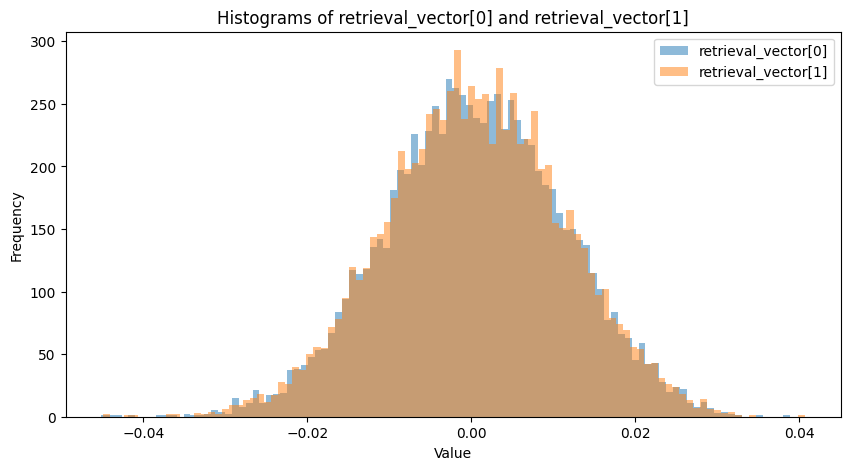

In [4]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 5))
plt.hist(retrieval_vector[0].cpu().numpy(), bins=100, alpha=0.5, label='retrieval_vector[0]')
plt.hist(retrieval_vector[1].cpu().numpy(), bins=100, alpha=0.5, label='retrieval_vector[1]')
plt.legend()
plt.title('Histograms of retrieval_vector[0] and retrieval_vector[1]')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()

In [5]:
v0 = retrieval_vector[0]
v1 = retrieval_vector[1]
score = torch.linalg.norm(v0 - v1)
print(f'score: {score}')

score: 0.08622786402702332


In [6]:
cos_sim = torch.nn.functional.cosine_similarity(v0, v1, dim=0)
print(f'cosine similarity: {cos_sim.item()}')

cosine similarity: 0.9962824583053589


## MegaLoc

In [5]:
# import torch

# megaloc_model = torch.hub.load("gmberton/MegaLoc", "get_trained_model")
# megaloc_model = megaloc_model.eval().to("cuda")

In [3]:
import torch
from vggt_slam.MegaLoc.megaloc_model import MegaLocModel

ckpt_path = 'checkpoints/megaloc.torch'

megaloc_model = MegaLocModel()
megaloc_model.load_state_dict(torch.load(ckpt_path))
megaloc_model = megaloc_model.eval().to("cuda")

Using cache found in /home/grl/.cache/torch/hub/facebookresearch_dinov2_main
/home/grl/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/home/grl/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/home/grl/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


In [4]:
with torch.no_grad():
    descriptors = megaloc_model(imgs.to("cuda"))

In [5]:
descriptors.shape

torch.Size([2, 8448])

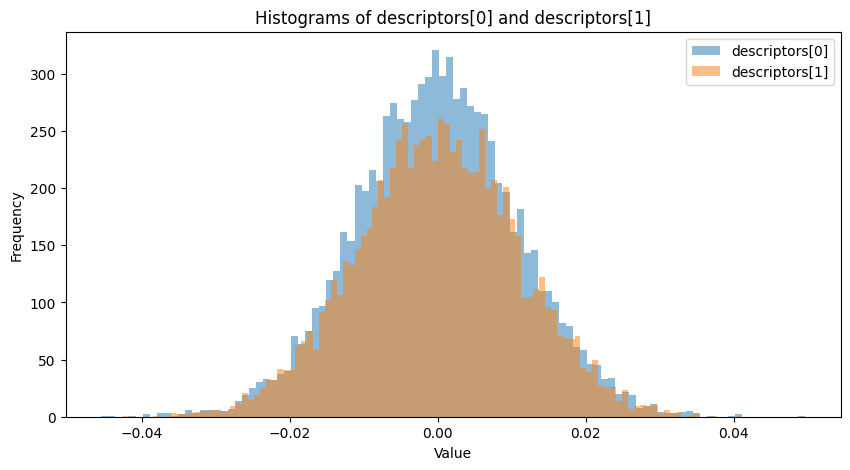

In [6]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 5))
plt.hist(descriptors[0].cpu().numpy(), bins=100, alpha=0.5, label='descriptors[0]')
plt.hist(descriptors[1].cpu().numpy(), bins=100, alpha=0.5, label='descriptors[1]')
plt.legend()
plt.title('Histograms of descriptors[0] and descriptors[1]')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()

In [7]:
desc0 = descriptors[0]
desc1 = descriptors[1]
score = torch.linalg.norm(desc0 - desc1)
print(f'score: {score}')

score: 1.2593199014663696


In [8]:
cos_sim = torch.nn.functional.cosine_similarity(desc0, desc1, dim=0)
print(f'cosine similarity: {cos_sim.item()}')

cosine similarity: 0.20705664157867432
